<style>
    .text_cell_render {
        font-family: Times New Roman, serif;
    }
</style>

<h1 align="center"> <b> Stochastic Simulation </b> <br/> Assignment 1  </h1>

---
---

In [3]:
### Generic Requirements ###
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

import ipywidgets as widgets
from IPython.display import display

In [4]:
### Local requirements ###
from mandelbrot import Mandelbrot, plotter, utils

from mandelbrot.sampling import pure_random as pr
from mandelbrot.sampling import latin_hypercube as lh
from mandelbrot.sampling import orthogonal as ol

---

<br/>

<h2 align="center"> <b> 1. Mandelbrot Set </b> </h1>

---

The Mandelbrot set $M$ is a two-dimensional set, defined by all the complex numbers $c$ for which the quadratic map, $$ f_c(z) = z^2 + c $$ remains bounded for iterations intialized at $z=0$.

In other words, $M$ is the set of points $c$ in the complex plane for which the sequence $Z_0=0$, $Z_{n+1}=Z^2_n + c$ is finite.

This notebook makes use of the package: https://github.com/DKLEINLEUNK/stochastic-simulation/tree/main/mandelbrot

By default, Mandelbrot sets are initialized as:

In [6]:
Mandelbrot(width=1000, height=1000, x_min=-1.7, x_max=0.7, y_min=-1.2, y_max=1.2)

Functions defined in the `plotter.py` and `utils.py` modules make use of the properties of the `Mandelbrot()` class.

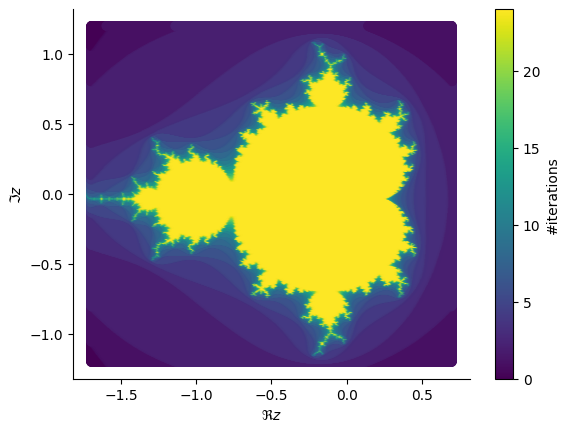

In [3]:
plotter.illustrate_mandelbrot_set(Mandelbrot(), max_iter=25)

---

<br/>

<h2 align="center"> <b> 2. Monte Carlo Integration </b> </h2>

---

<br/>

<h3 align="center"> 2.1 Simple Random Sampling </h3>

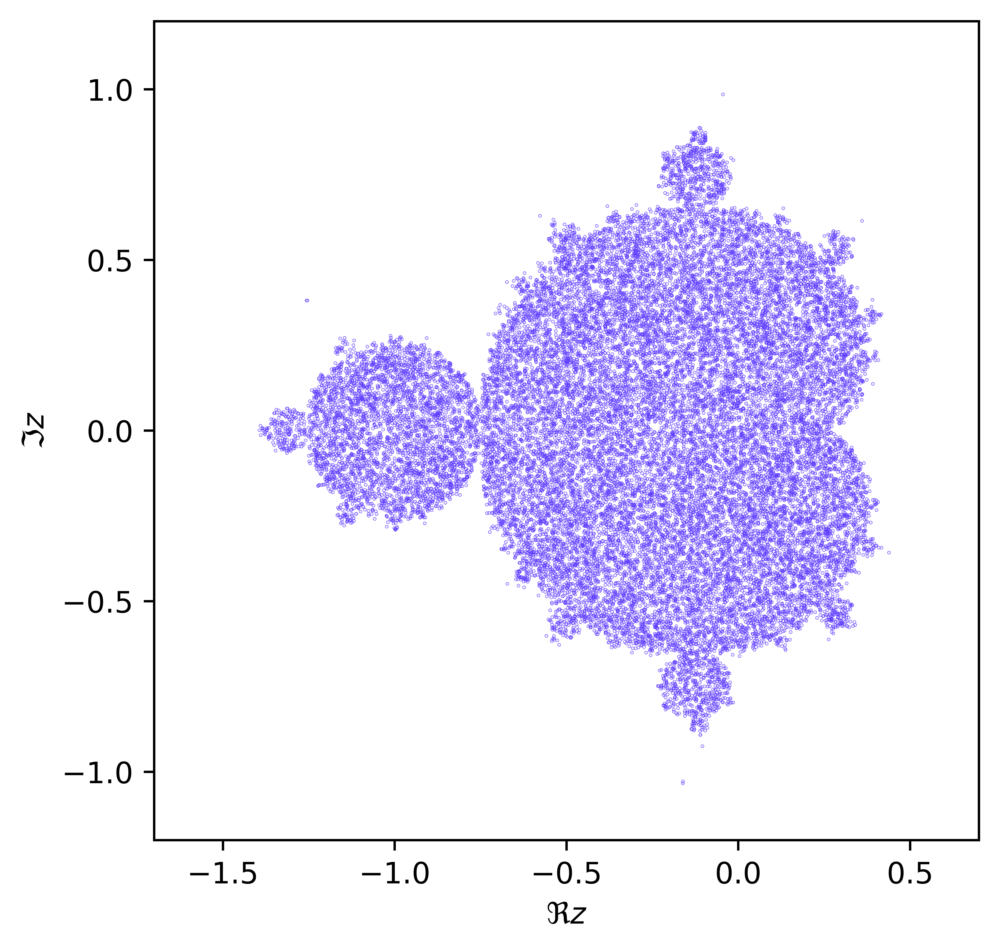

In [10]:
pr_sample, pr_in_mandelbrot = pr.sampler(
    Mandelbrot(), 
    n_samples=100_000, 
    max_iter=100, 
    verbose=False, 
    plot=True
)

In [ ]:
# TODO scale the width and height of high-DPI plot to match the format of the notebook
# out = widgets.Output(layout={'width': '500px', 'height': '500px'})
# with out:
#     plotter.plot_mandbrot_sample(mc_sample, mc_sample_in_mandelbrot, plot_color='b')
# display(out)

---

<br/>

<h3 align="center"> 2.2. Latin hypercube sampling </h3>

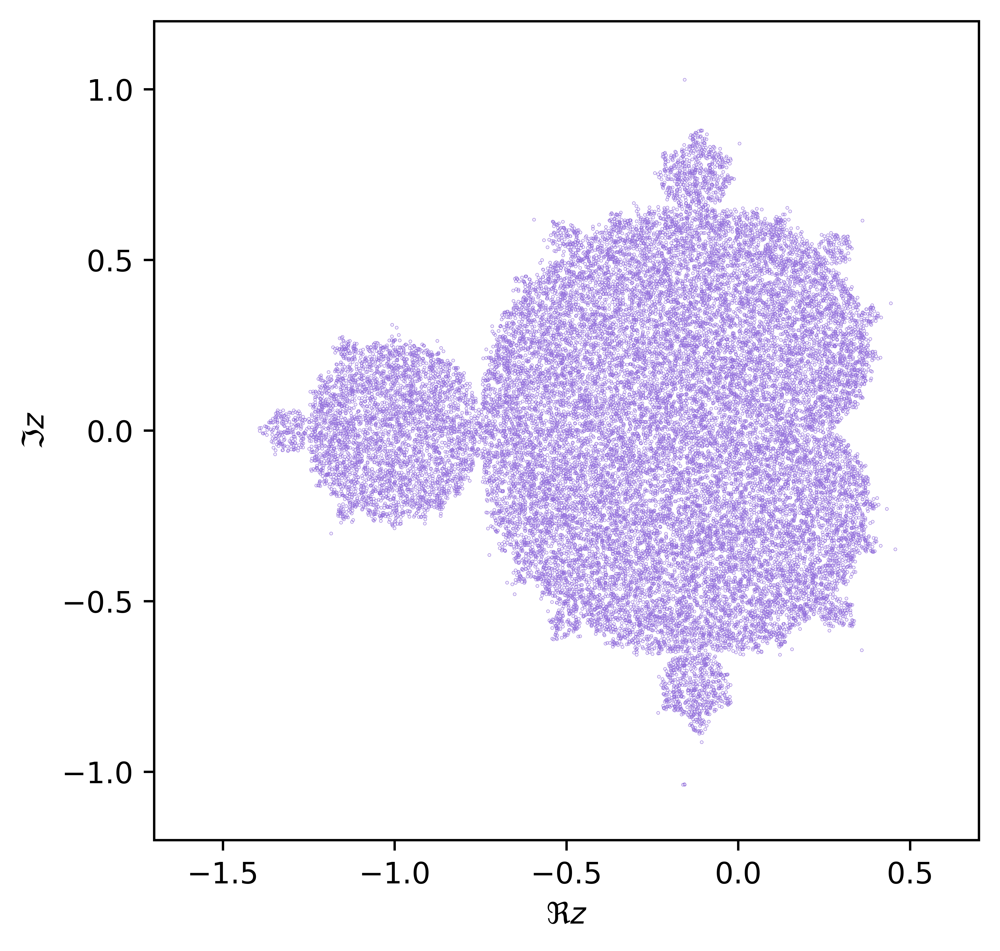

In [9]:
lh_sample, lh_in_mandelbrot = lh.sampler(
    Mandelbrot(), 
    n_samples=100_000, 
    max_iter=100, 
    verbose=False,
    plot=True
)

---

<br/>

<h3 align="center"> 2.3. Orthogonal sampling </h3>

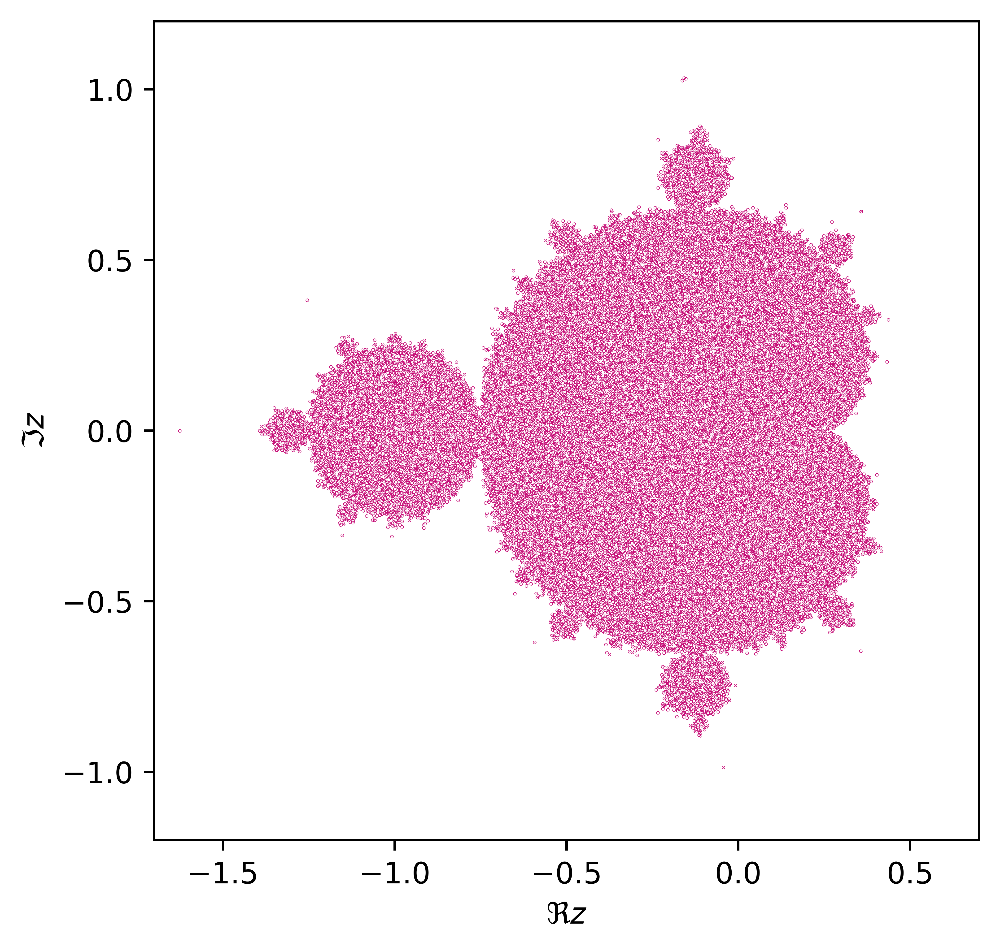

In [5]:
ol_sample, ol_in_mandelbrot = ol.sampler(
    Mandelbrot(), 
    n_sample=100_000, 
    max_iter=100, 
    verbose=False,
    plot=True
)

---

<br/>

<h2 align="center"> 3. Accuracy of the Monte Carlo Estimations </h2>

---
---

In [3]:
### Local requirements ###


---

<h3 align="center"> 3.1 Collecting Area Estimates </h3>

**Warning!** The code cells of this section have runtimes of approximately 5 minutes each. These cells also create files (which will overwrite the data used in this notebook).

In [ ]:
# utils.estimate_A_j_s(Mandelbrot(), pr.sampler, abbr='pr')  # Creates datafiles for pure random sampling

Running estimations for s = 100...
Done!
Running estimations for s = 1000...
Done!
Running estimations for s = 10000...
Done!
Running estimations for s = 100000...
Done!
Running estimations for s = 1000000...
Done!


In [ ]:
# utils.estimate_A_j_s(Mandelbrot(), lh.sampler, abbr='lh')  # Creates datafiles for latin hypercube sampling

Running estimations for s = 100...
Done!
Running estimations for s = 1000...
Done!
Running estimations for s = 10000...
Done!
Running estimations for s = 100000...
Done!
Running estimations for s = 1000000...
Done!


In [ ]:
# utils.estimate_A_j_s(Mandelbrot(), ol.sampler, abbr='ol')  # Creates datafiles for orthogonal sampling

Running estimations for s = 100...
Done!
Running estimations for s = 1000...
Done!
Running estimations for s = 10000...
Done!
Running estimations for s = 100000...
Done!
Running estimations for s = 1000000...
Done!


---

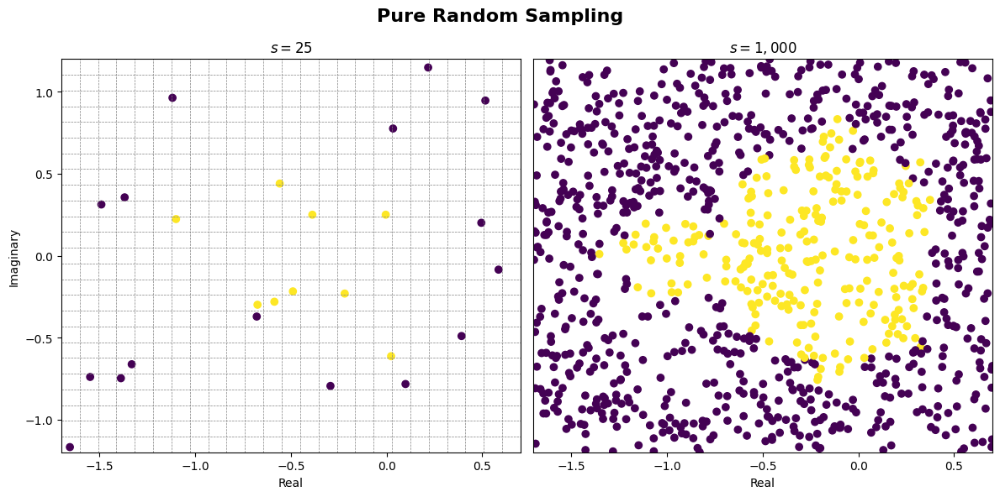

In [ ]:
plotter.illustrate_sampler(Mandelbrot(), pr.sampler)  # TODO change pure random to simple random

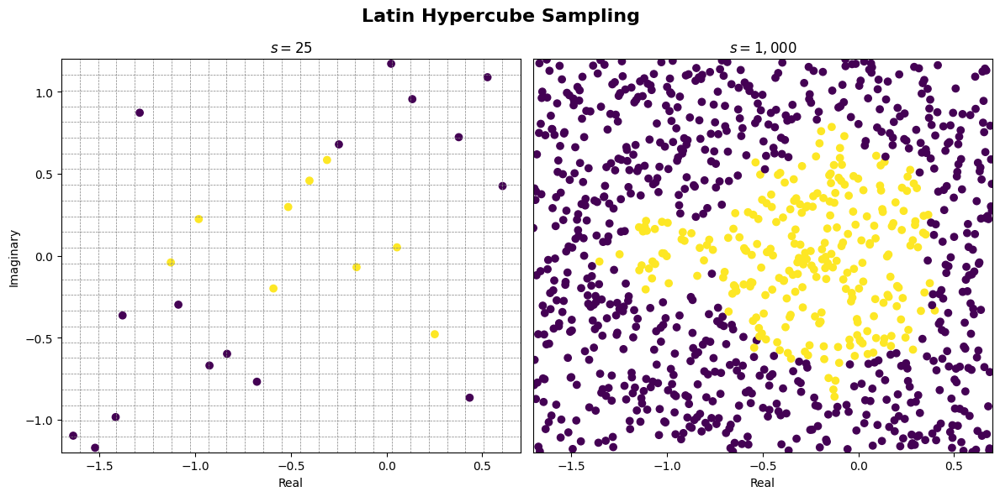

In [ ]:
# TODO (maybe?) add diagnol lines to illustrate diagnol clustering
plotter.illustrate_sampler(Mandelbrot(), lh.sampler, latin_hypercube=True)

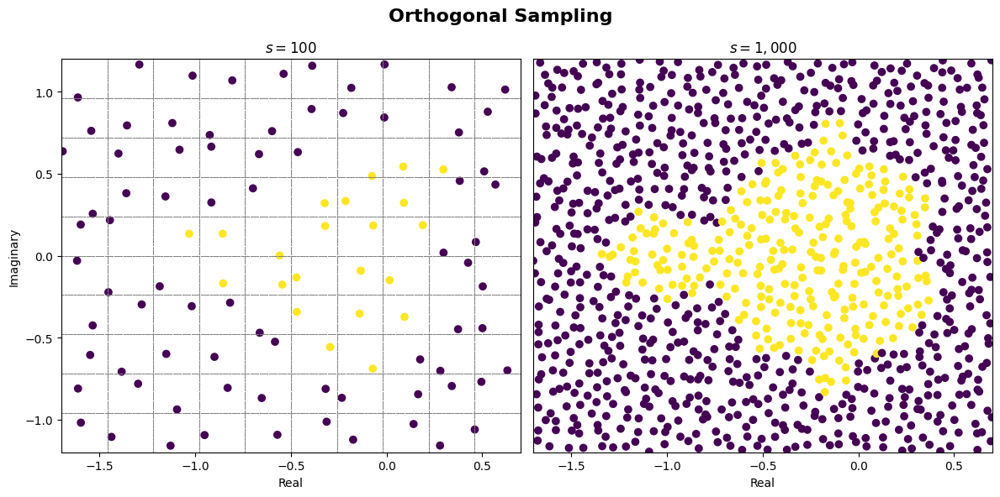

In [5]:
plotter.illustrate_sampler(Mandelbrot(), ol.sampler, orthogonal=True)

---

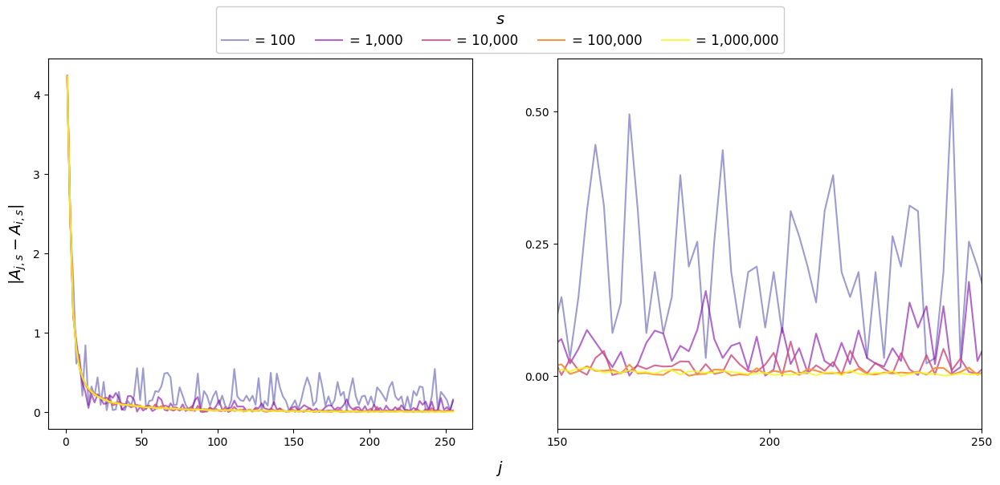

In [3]:
# TODO add x and y labels to the plot, remove y ticks

# New plot function
plotter.plot_convergence_A_to_js_A_is(A_is=1.521227, abbr='pr')

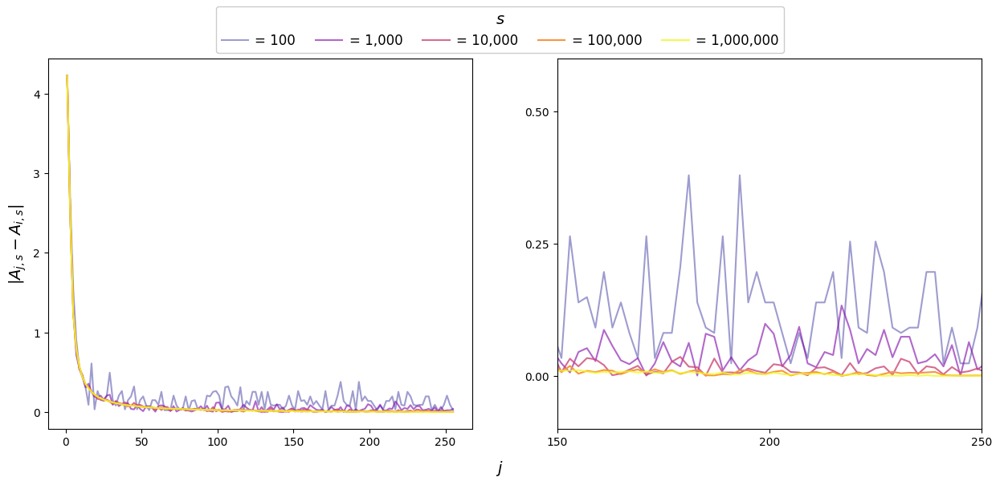

In [4]:
plotter.plot_convergence_A_to_js_A_is(A_is=1.521399, abbr='lh')

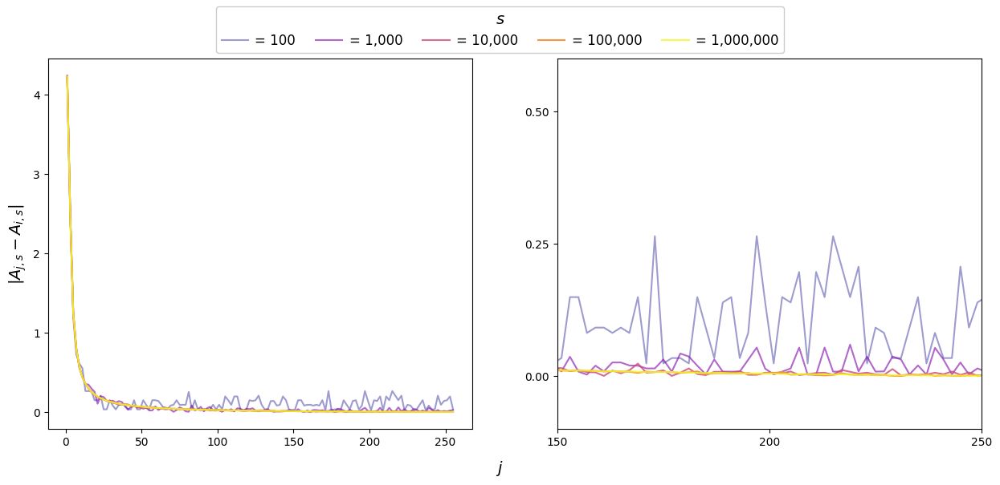

In [5]:
plotter.plot_convergence_A_to_js_A_is(A_is=1.521351, abbr='ol')

---

<h2 align="center"> 3.2 Confidence Intervals </h2>

**Warning!** The code block that is commented out had a runtime of around 40 minutes.

In [12]:
### Local requirements ###
import pandas as pd

from mandelbrot import utils
from mandelbrot.sampling import pure_random as pr
from mandelbrot.sampling import latin_hypercube as lh
from mandelbrot.sampling import orthogonal as ol

In [ ]:
# # 1. Run the simulations and estimate the means and standard deviations
# methods = ['Pure Random', 'Latin Hypercube', 'Orthogonal']
# pr_mean, pr_std, pr_err = utils.estimate_mean_area(250, pr.sampler, Mandelbrot(), n_samples=1_000_000, n_iters=255)
# lh_mean, lh_std, lh_err = utils.estimate_mean_area(250, lh.sampler, Mandelbrot(), n_samples=1_000_000, n_iters=255)
# ol_mean, ol_std, ol_err = utils.estimate_mean_area(250, ol.sampler, Mandelbrot(), n_samples=1_000_000, n_iters=255)

In [ ]:
# # 2. Export the results
# pd.DataFrame({
#     'method': methods,
#     'mean': [pr_mean, lh_mean, ol_mean],
#     'std': [pr_std, lh_std, ol_std],
#     'err': [pr_err, lh_err, ol_err]
#     }).to_csv('data/mean_areas.csv', index=False)

In [ ]:
pd.read_csv('data/mean_areas.csv')

,method,mean,std,err
0,Pure Random,1.521227,0.002617,0.000166
1,Latin Hypercube,1.521399,0.001597,0.000101
2,Orthogonal,1.521351,0.000241,0.000015


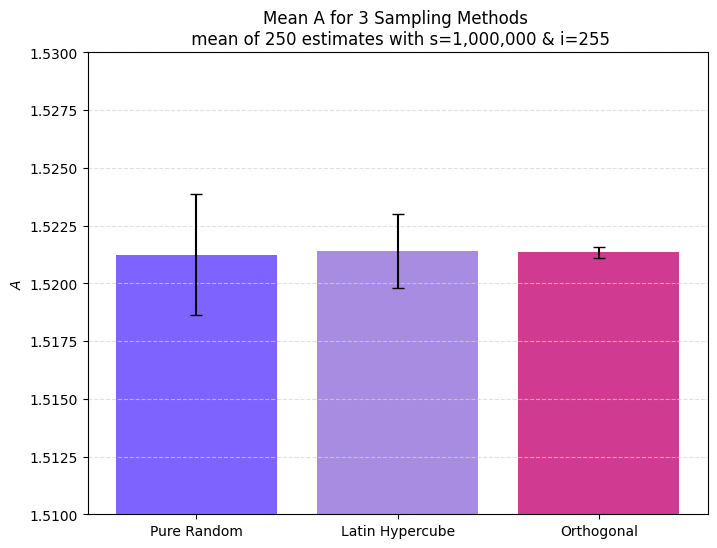

In [17]:
plt.figure(figsize=(8, 6))
x = [0, 1, 2]
y = pd.read_csv('data/mean_areas.csv')

plt.bar(
    x, 
    [y['mean'][0], y['mean'][1], y['mean'][2]], 
    yerr=[y['std'][0], y['std'][1], y['std'][2]], 
    capsize=4, 
    alpha=0.8, 
    color=['#5f3cff', '#9370DB', '#C50974']
)

plt.ylabel(r'$A$')
plt.ylim(1.51, 1.53)
plt.title('Mean A for 3 Sampling Methods \n mean of 250 estimates with s=1,000,000 & i=255')
plt.xticks(x, ['Pure Random', 'Latin Hypercube', 'Orthogonal'])
plt.grid(axis='y', linestyle='--', color='lightgrey', alpha=0.7)

plt.show()


---

<h2 align="center"> 4. Optimizing Area Estimation </h2>

In [6]:
# Suck my ass for now